In [1]:
%reload_ext autoreload
%autoreload 2

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

import os,sys,inspect
# currentdir = '/home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux'
current_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
print(current_dir)
sys.path.insert(0, current_dir)

import argparse
import time
import datetime
import torch
torch_version = torch.__version__
torch.autograd.set_detect_anomaly(True)
import apex

import torch.optim as optim
from torch.optim.lr_scheduler import MultiStepLR, ReduceLROnPlateau, StepLR
from tensorboardX import SummaryWriter
from tqdm import tqdm
import skimage.io as io

from utils.train_utils import *
from utils.model_utils import get_bins_combine
# from utils.eval_save_utils_combine_RCNNONly import check_eval_COCO, check_save, check_vis_coco, check_eval_SUN360, check_vis_SUN360
from models.model_RCNNOnly_combine_indeptPointnet_maskrcnnPose_discount import RCNNOnly_combine
from dataset_coco_pickle_eccv import my_collate, COCO2017Scale
# from adobe_camera_calibration_cvpr18.dataset_cvpr import SUN360Horizon, my_collate_SUN360
from utils.data_utils import make_data_loader
from maskrcnn_rui.data.transforms import build_transforms_maskrcnn, build_transforms_yannick
from utils.logger import setup_logger, printer
from utils.checkpointer import DetectronCheckpointer
from maskrcnn_rui.engine.inference import _accumulate_predictions_from_multiple_gpus, _dict_to_list

from maskrcnn_rui.config import cfg
from maskrcnn_rui.utils.comm import synchronize, get_rank
from maskrcnn_rui.utils.metric_logger import MetricLogger

import utils.vis_utils as vis_utils

parser = argparse.ArgumentParser(description="Rui's Scale Estimation Network Training")
# Training
parser.add_argument('--task_name', type=str, default='tmp', help='resume training')
parser.add_argument('--workers', type=int, help='number of data loading workers', default=8)
parser.add_argument('--save_every_iter', type=int, default=0, help='set to 0 to save ONLY at the end of each epoch')
parser.add_argument('--summary_every_iter', type=int, default=20, help='')
parser.add_argument('--nepoch', type=int, default=15000, help='number of epochs to train for')
parser.add_argument('--beta1', type=float, default=0.9, help='beta1 for adam. default=0.5')
parser.add_argument('--not_val', action='store_true', help='Do not validate duruign training')
parser.add_argument('--not_vis', action='store_true', help='')
parser.add_argument('--not_vis_SUN360', action='store_true', help='')
parser.add_argument('--save_every_epoch', type=int, default=10, help='save checkpoint every ? epoch')
parser.add_argument('--vis_every_epoch', type=int, default=5, help='vis every ? epoch')
# Model
parser.add_argument('--accu_model', action='store_true', help='Use accurate model with theta instead of Derek\'s approx.')
parser.add_argument('--argmax_val', action='store_true', help='')
parser.add_argument('--direct_camH', action='store_true', help='direct preidict one number for camera height ONLY, instead of predicting a distribution')
parser.add_argument('--direct_v0', action='store_true', help='direct preidict one number for v0 ONLY, instead of predicting a distribution')
parser.add_argument('--direct_fmm', action='store_true', help='direct preidict one number for fmm ONLY, instead of predicting a distribution')

# Pre-training
parser.add_argument('--resume', type=str, help='resume training; can be full path (e.g. tmp/checkpoint0.pth.tar) or taskname (e.g. tmp)', default='NoCkpt')
parser.add_argument('--feature_only', action='store_true', help='restore only features (remove all classifiers) from checkpoint')
parser.add_argument('--reset_scheduler', action='store_true', help='') # NOT working yet
parser.add_argument('--reset_lr', action='store_true', help='') # NOT working yet

# Device
parser.add_argument('--cpu', action='store_true', help='Force training on CPU')
parser.add_argument("--local_rank", type=int, default=0)
parser.add_argument("--master_port", type=str, default='8914')

# DEBUG
parser.add_argument('--debug', action='store_true', help='Debug eval')
parser.add_argument('--debug_memory', action='store_true', help='Debug eval')

# Mask R-CNN
## Modules
parser.add_argument('--train_cameraCls', action='store_true', help='Disable camera calibration network')
parser.add_argument('--train_roi_h', action='store_true', help='')
parser.add_argument('--est_bbox', action='store_true', help='Enable estimating bboxes instead of using GT bboxes')
parser.add_argument('--est_kps', action='store_true', help='Enable estimating keypoints')
parser.add_argument('--if_discount', action='store_true', help='')
parser.add_argument('--discount_from', type=str, default='GT') # ('GT', 'pred')

## Losses
parser.add_argument('--loss_last_layer', action='store_true', help='Using loss of last layer only')
parser.add_argument('--loss_person_all_layers', action='store_true', help='Using loss of last layer only')
parser.add_argument('--not_rcnn', action='store_true', help='Disable Mask R-CNN person height bbox head')
parser.add_argument('--no_kps_loss', action='store_true', help='')

## Archs
parser.add_argument('--pointnet_camH', action='store_true', help='')
parser.add_argument('--pointnet_camH_refine', action='store_true', help='')
parser.add_argument('--pointnet_personH_refine', action='store_true', help='')
parser.add_argument('--pointnet_roi_feat_input', action='store_true', help='') # NOT working yet
parser.add_argument('--pointnet_roi_feat_input_person3', action='store_true', help='') # NOT working yet
parser.add_argument('--pointnet_fmm_refine', action='store_true', help='') # NOT working yet
parser.add_argument('--pointnet_v0_refine', action='store_true', help='') # NOT working yet
parser.add_argument('--not_pointnet_detach_input', action='store_true', help='') # NOT working yet
parser.add_argument("--num_layers", type=int, default=3)
parser.add_argument('--fit_derek', action='store_true', help='')
## weights
parser.add_argument('--weight_SUN360', type=float, default=10., help='weight for Yannick\'s losses. default=1.')
parser.add_argument('--weight_kps', type=float, default=1e-3, help='weight for Yannick\'s losses. default=1.')

## debug
parser.add_argument('--zero_pitch', action='store_true', help='') # NOT working yet

parser.add_argument(
    "--config-file",
    default="",
    metavar="FILE",
    help="path to config file",
    type=str,
)
parser.add_argument(
    "opts",
    help="Modify config options using the command-line",
    default=None,
    nargs=argparse.REMAINDER,
)

# [2.1-SN-L3] 20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers
opt = parser.parse_args('--task_name tmp_eval --num_layers 3 \
--train_cameraCls --train_roi_h --pointnet_camH --pointnet_camH_refine --pointnet_personH_refine --accu_model --no_kps_loss --loss_person_all_layers \
--resume YES --config-file coco_config_small_synBN1108_kps.yaml  --weight_SUN360=10. \
MODEL.LOSS.VT_LOSS_CLAMP 2. SOLVER.IMS_PER_BATCH 16 TEST.IMS_PER_BATCH 16 SOLVER.PERSON_WEIGHT 0.05 SOLVER.BASE_LR 1e-5 MODEL.HUMAN.MEAN 1.70 MODEL.HUMAN.STD 0.15 MODEL.RCNN_WEIGHT_BACKBONE 0212-2047_mm2_SUN360RCNN_LossposeCamera_lr1e-5_NOsubsample-prepare_targets_for_gt_box_input-removeOutOfBox_wKps1-SUN10_RE MODEL.RCNN_WEIGHT_CLS_HEAD 0212-2047_mm2_SUN360RCNN_LossposeCamera_lr1e-5_NOsubsample-prepare_targets_for_gt_box_input-removeOutOfBox_wKps1-SUN10_RE MODEL.RCNN_WEIGHT_KPS_HEAD 0212-2047_mm2_SUN360RCNN_LossposeCamera_lr1e-5_NOsubsample-prepare_targets_for_gt_box_input-removeOutOfBox_wKps1-SUN10_RE'\
                       .split())

print(opt)
                        
opt.checkpoints_folder = 'checkpoint'

config_file = opt.config_file
cfg.merge_from_file(config_file)
# manual override some options
cfg.merge_from_list(["MODEL.DEVICE", "cuda"])
cfg.merge_from_list(opt.opts)
cfg.freeze()

opt.cfg = cfg

# sys.path.insert(0, cfg.MODEL.POINTNET.PATH)
opt.rank = opt.local_rank

num_gpus = 1
opt.distributed = num_gpus > 1
device = 'cuda'
opt.device = device
print("Device:", device)

# === SUMMARY WRITERS
summary_path = './summary/'+opt.task_name
writer = SummaryWriter(summary_path)

# === LOGGING
logger = setup_logger("logger:train", summary_path, get_rank(), filename="logger_maskrcn-style.txt")
logger.info(colored("==[config]== opt", 'white', 'on_blue'))
logger.info(opt)
logger.info(colored("==[config]== cfg", 'white', 'on_blue'))
logger.info(cfg)
logger.info(colored("==[config]== Loaded configuration file {}".format(opt.config_file), 'white', 'on_blue'))
with open(opt.config_file, "r") as cf:
    config_str = "\n" + cf.read()
    logger.info(config_str)
printer = printer(get_rank(), debug=opt.debug)

/home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal
[data-SUN360] Narrower in DS_ROOT:data/SUN360_mini_crops_dataset_cvpr_myDistNarrowerLarge1105
Namespace(accu_model=True, argmax_val=False, beta1=0.9, config_file='coco_config_small_synBN1108_kps.yaml', cpu=False, debug=False, debug_memory=False, direct_camH=False, direct_fmm=False, direct_v0=False, discount_from='GT', est_bbox=False, est_kps=False, feature_only=False, fit_derek=False, if_discount=False, local_rank=0, loss_last_layer=False, loss_person_all_layers=True, master_port='8914', nepoch=15000, no_kps_loss=True, not_pointnet_detach_input=False, not_rcnn=False, not_val=False, not_vis=False, not_vis_SUN360=False, num_layers=3, opts=['MODEL.LOSS.VT_LOSS_CLAMP', '2.', 'SOLVER.IMS_PER_BATCH', '16', 'TEST.IMS_PER_BATCH', '16', 'SOLVER.PERSON_WEIGHT', '0.05', 'SOLVER.BASE_LR', '1e-5', 'MODEL.HUMAN.MEAN', '1.70', 'MODEL.HUMAN.STD', '0.15', 'MODEL.RCNN_WEIGHT_BACKBONE', '021

logger:train INFO: ==[config]== cfg
logger:train INFO: AMP_VERBOSE: False
DATA:
  COCO:
    CLIP_N_IN_MASKRCNN: False
    COCO_SUBSET: coco_scale_eccv
    GOOD_NUM: 10
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  NUM_WORKERS: 4
  SIZE_DIVISIBILITY: 0
DATASETS:
  TEST: ()
  TRAIN: ()
DTYPE: float32
INPUT:
  BRIGHTNESS: 0.0
  CONTRAST: 0.0
  HORIZONTAL_FLIP_PROB_TRAIN: 0.0
  HUE: 0.0
  MAX_SIZE_TEST: 800
  MAX_SIZE_TRAIN: 800
  MIN_SIZE_TEST: 600
  MIN_SIZE_TRAIN: (600,)
  PIXEL_MEAN: [103.53, 116.28, 123.675]
  PIXEL_STD: [57.375, 57.12, 58.395]
  SATURATION: 0.0
  TO_BGR255: True
  VERTICAL_FLIP_PROB_TRAIN: 0.0
MODEL:
  BACKBONE:
    CONV_BODY: FBNet
    FREEZE_CONV_BODY_AT: 2
  CAR:
    MEAN: 1.59
    STD: 0.21
  CLASSIFIER_HEAD:
    FEATURE_EXTRACTOR: FBNet.roi_head
    NUM_CLASSES: 256
    POOLER_RESOLUTION: 6
    POOLER_SAMPLING_RATIO: 2
    POOLER_SCALES: (0.25, 0.125, 0.0625, 0.03125)
    PREDICTOR: FCPredictorRui
  CLS_AGNOSTIC_BBOX_REG: False
  DENSENET_WEIGHT: 
  DEVICE: cuda
 

In [2]:
# === MODEL & TRAINING
modules_not_build = []
if not opt.train_cameraCls:
    modules_not_build.append('classifier_heads')
if not opt.train_roi_h:
    modules_not_build.append('roi_h_heads')
if not opt.est_bbox and not opt.est_kps:
    modules_not_build.append('roi_bbox_heads')
sys.path.insert(0, 'models/pointnet')
model = RCNNOnly_combine(opt, logger, printer, num_layers=opt.num_layers, modules_not_build=modules_not_build)

# model.print_net()
# model.init_restore()
# model.set_train_params()
model.to(device)
model.turn_on_all_params()

for name, param in model.named_parameters():
    printer.print(name, param.shape, param.requires_grad)
printer.print('ALL %d params'%len(list(model.named_parameters())))

optimizer = optim.Adam(model.parameters(), lr=cfg.SOLVER.BASE_LR, betas=(opt.beta1, 0.999), eps=1e-5)
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=100, cooldown=50)

modules_not_build ['roi_bbox_heads']
if_shared_kps_head:  False False RCNN-kps
BatchNorm1d(64, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(64, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(64, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(128, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(1024, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(512, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(256, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(64, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(128, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(1024, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(512, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
BatchNorm1d(256, eps=

In [3]:
# === CHECKPOINT

# [1] 20200221-120910_pod_firstKpsAndRest_batchsize8_KaimingInit_adam_wPerson05_wKPS1e-3_720-540_REafterDeathV_afterFaster_bs16_fix3_DISCOUNTfromPredkps__personLoss3Layers
# opt.resume = '20200221-120910_pod_firstKpsAndRest_batchsize8_KaimingInit_adam_wPerson05_wKPS1e-3_720-540_REafterDeathV_afterFaster_bs16_fix3_DISCOUNTfromPredkps__personLoss3Layers'
# [2.1] 20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers
opt.resume = '20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers'


opt.checkpoints_path_task = os.path.join(opt.checkpoints_folder, opt.task_name)
save_to_disk = get_rank() == 0
checkpointer = DetectronCheckpointer(
    opt, model, optimizer, scheduler, opt.checkpoints_folder, opt.checkpoints_path_task, save_to_disk, logger=logger
)
tid_start = 0
epoch_start = 0
if opt.resume != 'NoCkpt':
    checkpoint_restored, _, _ = checkpointer.load(task_name=opt.resume)
    if 'iteration' in checkpoint_restored:
        tid_start = checkpoint_restored['iteration']
    if 'epoch' in checkpoint_restored:
        epoch_start = checkpoint_restored['epoch']
    print(checkpoint_restored.keys())
    logger.info(colored('Restoring from epoch %d - iter %d'%(epoch_start, tid_start), 'white', 'on_blue'))
model.print_net()


logger:train INFO: Using 'latest checkpoint' from task 20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers...; at /cephfs/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/checkpoint/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers/checkpointer_epoch0006_iter0171340.pth
logger:train INFO: Loading checkpoint from /cephfs/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/checkpoint/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers/checkpointer_epoch0006_iter0171340.pth.
logger:train WARNING: ====== current_keys 1191; loaded keys 1191
logger:train WARNING: RCNN.backbone.body.first.bn.bias                                                                               <<LOADED FROM<< RCNN.backbone.body.first.bn.bias                    

logger:train WARNING: RCNN.backbone.body.stages.xif1_0.pwl.bn.num_batches_tracked                                                    <<LOADED FROM<< RCNN.backbone.body.stages.xif1_0.pwl.bn.num_batches_tracked                                                    of shape ()
logger:train WARNING: RCNN.backbone.body.stages.xif1_0.pwl.bn.running_mean                                                           <<LOADED FROM<< RCNN.backbone.body.stages.xif1_0.pwl.bn.running_mean                                                           of shape (48,)
logger:train WARNING: RCNN.backbone.body.stages.xif1_0.pwl.bn.running_var                                                            <<LOADED FROM<< RCNN.backbone.body.stages.xif1_0.pwl.bn.running_var                                                            of shape (48,)
logger:train WARNING: RCNN.backbone.body.stages.xif1_0.pwl.bn.weight                                                                 <<LOADED FROM<< RCNN.backbone.body.stages.xif

logger:train WARNING: RCNN.backbone.body.stages.xif2_0.pwl.conv.weight                                                               <<LOADED FROM<< RCNN.backbone.body.stages.xif2_0.pwl.conv.weight                                                               of shape (64, 336, 1, 1)
logger:train WARNING: RCNN.backbone.body.stages.xif2_1.dw.conv.weight                                                                <<LOADED FROM<< RCNN.backbone.body.stages.xif2_1.dw.conv.weight                                                                of shape (448, 1, 3, 3)
logger:train WARNING: RCNN.backbone.body.stages.xif2_1.pw.bn.bias                                                                    <<LOADED FROM<< RCNN.backbone.body.stages.xif2_1.pw.bn.bias                                                                    of shape (448,)
logger:train WARNING: RCNN.backbone.body.stages.xif2_1.pw.bn.num_batches_tracked                                                     <<LOADED FROM<< RCNN.b

logger:train WARNING: RCNN.backbone.body.stages.xif2_3.pw.bn.running_mean                                                            <<LOADED FROM<< RCNN.backbone.body.stages.xif2_3.pw.bn.running_mean                                                            of shape (448,)
logger:train WARNING: RCNN.backbone.body.stages.xif2_3.pw.bn.running_var                                                             <<LOADED FROM<< RCNN.backbone.body.stages.xif2_3.pw.bn.running_var                                                             of shape (448,)
logger:train WARNING: RCNN.backbone.body.stages.xif2_3.pw.bn.weight                                                                  <<LOADED FROM<< RCNN.backbone.body.stages.xif2_3.pw.bn.weight                                                                  of shape (448,)
logger:train WARNING: RCNN.backbone.body.stages.xif2_3.pw.conv.weight                                                                <<LOADED FROM<< RCNN.backbone.body.stag

logger:train WARNING: RCNN.backbone.body.stages.xif3_0.pwl.bn.bias                                                                   <<LOADED FROM<< RCNN.backbone.body.stages.xif3_0.pwl.bn.bias                                                                   of shape (56,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_0.pwl.bn.num_batches_tracked                                                    <<LOADED FROM<< RCNN.backbone.body.stages.xif3_0.pwl.bn.num_batches_tracked                                                    of shape ()
logger:train WARNING: RCNN.backbone.body.stages.xif3_0.pwl.bn.running_mean                                                           <<LOADED FROM<< RCNN.backbone.body.stages.xif3_0.pwl.bn.running_mean                                                           of shape (56,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_0.pwl.bn.running_var                                                            <<LOADED FROM<< RCNN.backbone.body.stages.xif

logger:train WARNING: RCNN.backbone.body.stages.xif3_10.pwl.bn.weight                                                                <<LOADED FROM<< RCNN.backbone.body.stages.xif3_10.pwl.bn.weight                                                                of shape (88,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_10.pwl.conv.weight                                                              <<LOADED FROM<< RCNN.backbone.body.stages.xif3_10.pwl.conv.weight                                                              of shape (88, 704, 1, 1)
logger:train WARNING: RCNN.backbone.body.stages.xif3_11.dw.conv.weight                                                               <<LOADED FROM<< RCNN.backbone.body.stages.xif3_11.dw.conv.weight                                                               of shape (704, 1, 3, 3)
logger:train WARNING: RCNN.backbone.body.stages.xif3_11.pw.bn.bias                                                                   <<LOADED FROM<< RCNN.ba

logger:train WARNING: RCNN.backbone.body.stages.xif3_3.pw.bn.num_batches_tracked                                                     <<LOADED FROM<< RCNN.backbone.body.stages.xif3_3.pw.bn.num_batches_tracked                                                     of shape ()
logger:train WARNING: RCNN.backbone.body.stages.xif3_3.pw.bn.running_mean                                                            <<LOADED FROM<< RCNN.backbone.body.stages.xif3_3.pw.bn.running_mean                                                            of shape (672,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_3.pw.bn.running_var                                                             <<LOADED FROM<< RCNN.backbone.body.stages.xif3_3.pw.bn.running_var                                                             of shape (672,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_3.pw.bn.weight                                                                  <<LOADED FROM<< RCNN.backbone.body.stages.x

logger:train WARNING: RCNN.backbone.body.stages.xif3_5.pw.conv.weight                                                                <<LOADED FROM<< RCNN.backbone.body.stages.xif3_5.pw.conv.weight                                                                of shape (672, 56, 1, 1)
logger:train WARNING: RCNN.backbone.body.stages.xif3_5.pwl.bn.bias                                                                   <<LOADED FROM<< RCNN.backbone.body.stages.xif3_5.pwl.bn.bias                                                                   of shape (56,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_5.pwl.bn.num_batches_tracked                                                    <<LOADED FROM<< RCNN.backbone.body.stages.xif3_5.pwl.bn.num_batches_tracked                                                    of shape ()
logger:train WARNING: RCNN.backbone.body.stages.xif3_5.pwl.bn.running_mean                                                           <<LOADED FROM<< RCNN.backbone.body.

logger:train WARNING: RCNN.backbone.body.stages.xif3_7.pwl.bn.running_var                                                            <<LOADED FROM<< RCNN.backbone.body.stages.xif3_7.pwl.bn.running_var                                                            of shape (88,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_7.pwl.bn.weight                                                                 <<LOADED FROM<< RCNN.backbone.body.stages.xif3_7.pwl.bn.weight                                                                 of shape (88,)
logger:train WARNING: RCNN.backbone.body.stages.xif3_7.pwl.conv.weight                                                               <<LOADED FROM<< RCNN.backbone.body.stages.xif3_7.pwl.conv.weight                                                               of shape (88, 448, 1, 1)
logger:train WARNING: RCNN.backbone.body.stages.xif3_8.dw.conv.weight                                                                <<LOADED FROM<< RCNN.backbone.bo

logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.bias                       <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.bias                       of shape (616,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.num_batches_tracked        <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.num_batches_tracked        of shape ()
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.running_mean               <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.running_mean               of shape (616,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_0.pw.bn.running_var                <<LOADED FROM<< RCNN.classifier_heads.class

logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pw.bn.weight                     <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pw.bn.weight                     of shape (1064,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pw.conv.weight                   <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pw.conv.weight                   of shape (1064, 152, 1, 1)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pwl.bn.bias                      <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pwl.bn.bias                      of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pwl.bn.num_batches_tracked       <<LOADED FROM<< RCNN.classi

logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.bn.running_mean              <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.bn.running_mean              of shape (104,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.bn.running_var               <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.bn.running_var               of shape (104,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.bn.weight                    <<LOADED FROM<< RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.bn.weight                    of shape (104,)
logger:train WARNING: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_4.pwl.conv.weight                  <<LOADED FROM<< RCNN.classifier_heads.c

logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.bias                        <<LOADED FROM<< RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.bias                        of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.num_batches_tracked         <<LOADED FROM<< RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.num_batches_tracked         of shape ()
logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.running_mean                <<LOADED FROM<< RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.running_mean                of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_1.pwl.bn.running_var                 <<LOADED FROM<< RCNN.classifier_heads.class

logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_3.pwl.bn.weight                      <<LOADED FROM<< RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_3.pwl.bn.weight                      of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_3.pwl.conv.weight                    <<LOADED FROM<< RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_3.pwl.conv.weight                    of shape (152, 1064, 1, 1)
logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.dw.conv.weight                     <<LOADED FROM<< RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.dw.conv.weight                     of shape (1520, 1, 3, 3)
logger:train WARNING: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.pw.bn.bias                         <<LOADED FROM<< RCN

logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.bn.running_mean                 <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.bn.running_mean                 of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.bn.running_var                  <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.bn.running_var                  of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.bn.weight                       <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.bn.weight                       of shape (152,)
logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_0.pwl.conv.weight                     <<LOADED FROM<< RCNN.classifier_heads.c

logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.dw.conv.weight                      <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.dw.conv.weight                      of shape (1064, 1, 3, 3)
logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.pw.bn.bias                          <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.pw.bn.bias                          of shape (1064,)
logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.pw.bn.num_batches_tracked           <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.pw.bn.num_batches_tracked           of shape ()
logger:train WARNING: RCNN.classifier_heads.classifier_roll.feature_extractor.head.blocks.xif4_3.pw.bn.running_mean                  <<LOADED FROM<< RCNN.classifier_h

logger:train WARNING: RCNN.classifier_heads.classifier_roll.predictor.fc7_dim_reduce.bias                                            <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.predictor.fc7_dim_reduce.bias                                            of shape (16,)
logger:train WARNING: RCNN.classifier_heads.classifier_roll.predictor.fc7_dim_reduce.weight                                          <<LOADED FROM<< RCNN.classifier_heads.classifier_roll.predictor.fc7_dim_reduce.weight                                          of shape (16, 64)
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_0.dw.conv.weight                      <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_0.dw.conv.weight                      of shape (616, 1, 3, 3)
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_0.pw.bn.bias                          <<LOADED FROM<< RCNN.classifie

logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.num_batches_tracked           <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.num_batches_tracked           of shape ()
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.running_mean                  <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.running_mean                  of shape (1064,)
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.running_var                   <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.running_var                   of shape (1064,)
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_2.pw.bn.weight                        <<LOADED FROM<< RCNN.classifier_heads.cla

logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pw.conv.weight                      <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pw.conv.weight                      of shape (1520, 152, 1, 1)
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pwl.bn.bias                         <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pwl.bn.bias                         of shape (104,)
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pwl.bn.num_batches_tracked          <<LOADED FROM<< RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pwl.bn.num_batches_tracked          of shape ()
logger:train WARNING: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_4.pwl.bn.running_mean                 <<LOADED FROM<< RCNN.classifier_

logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pw.bn.running_var                               <<LOADED FROM<< RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pw.bn.running_var                               of shape (1064,)
logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pw.bn.weight                                    <<LOADED FROM<< RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pw.bn.weight                                    of shape (1064,)
logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pw.conv.weight                                  <<LOADED FROM<< RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pw.conv.weight                                  of shape (1064, 152, 1, 1)
logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_1.pwl.bn.bias                                     <<LOADED FROM<< RCNN.roi_h

logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.num_batches_tracked                      <<LOADED FROM<< RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.num_batches_tracked                      of shape ()
logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.running_mean                             <<LOADED FROM<< RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.running_mean                             of shape (152,)
logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.running_var                              <<LOADED FROM<< RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.running_var                              of shape (152,)
logger:train WARNING: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.weight                                   <<LOADED FROM<< RCNN.roi_h_heads.person_h.f

logger:train WARNING: net_PointNet.fc.bn.weight                                                                                      <<LOADED FROM<< net_PointNet.fc.bn.weight                                                                                      of shape (256,)
logger:train WARNING: net_PointNet.fc.fc.weight                                                                                      <<LOADED FROM<< net_PointNet.fc.fc.weight                                                                                      of shape (256, 256)
logger:train WARNING: net_PointNet.mlp_global.0.bn.bias                                                                              <<LOADED FROM<< net_PointNet.mlp_global.0.bn.bias                                                                              of shape (512,)
logger:train WARNING: net_PointNet.mlp_global.0.bn.num_batches_tracked                                                               <<LOADED FROM<< net_PointNet.mlp_gl

logger:train WARNING: net_PointNet.mlp_local.2.bn.weight                                                                             <<LOADED FROM<< net_PointNet.mlp_local.2.bn.weight                                                                             of shape (1024,)
logger:train WARNING: net_PointNet.mlp_local.2.conv.weight                                                                           <<LOADED FROM<< net_PointNet.mlp_local.2.conv.weight                                                                           of shape (1024, 128, 1)
logger:train WARNING: net_PointNet.stem.mlp.0.bn.bias                                                                                <<LOADED FROM<< net_PointNet.stem.mlp.0.bn.bias                                                                                of shape (64,)
logger:train WARNING: net_PointNet.stem.mlp.0.bn.num_batches_tracked                                                                 <<LOADED FROM<< net_PointNet.st

logger:train WARNING: net_PointNet.stem.transform_feature.mlp_local.0.bn.running_mean                                                <<LOADED FROM<< net_PointNet.stem.transform_feature.mlp_local.0.bn.running_mean                                                of shape (64,)
logger:train WARNING: net_PointNet.stem.transform_feature.mlp_local.0.bn.running_var                                                 <<LOADED FROM<< net_PointNet.stem.transform_feature.mlp_local.0.bn.running_var                                                 of shape (64,)
logger:train WARNING: net_PointNet.stem.transform_feature.mlp_local.0.bn.weight                                                      <<LOADED FROM<< net_PointNet.stem.transform_feature.mlp_local.0.bn.weight                                                      of shape (64,)
logger:train WARNING: net_PointNet.stem.transform_feature.mlp_local.0.conv.weight                                                    <<LOADED FROM<< net_PointNet.stem.transfor

logger:train WARNING: net_PointNet.stem.transform_input.mlp_local.0.bn.bias                                                          <<LOADED FROM<< net_PointNet.stem.transform_input.mlp_local.0.bn.bias                                                          of shape (64,)
logger:train WARNING: net_PointNet.stem.transform_input.mlp_local.0.bn.num_batches_tracked                                           <<LOADED FROM<< net_PointNet.stem.transform_input.mlp_local.0.bn.num_batches_tracked                                           of shape ()
logger:train WARNING: net_PointNet.stem.transform_input.mlp_local.0.bn.running_mean                                                  <<LOADED FROM<< net_PointNet.stem.transform_input.mlp_local.0.bn.running_mean                                                  of shape (64,)
logger:train WARNING: net_PointNet.stem.transform_input.mlp_local.0.bn.running_var                                                   <<LOADED FROM<< net_PointNet.stem.transform_i

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.0.bn.weight                                     <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.0.bn.weight                                     of shape (512,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.0.fc.weight                                     <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.0.fc.weight                                     of shape (512, 1024)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.1.bn.bias                                       <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.1.bn.bias                                       of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.mlp_global.1.bn.num_batches_tracked                        <<LOADED FROM<< net_PointNet_refin

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.bn.weight                                       <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.bn.weight                                       of shape (64,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.conv.weight                                     <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.conv.weight                                     of shape (64, 9, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.1.bn.bias                                         <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.1.bn.bias                                         of shape (64,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.1.bn.num_batches_tracked                          <<LOADED FROM<< net_PointNet_refine_l

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.bn.running_mean         <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.bn.running_mean         of shape (128,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.bn.running_var          <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.bn.running_var          of shape (128,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.bn.weight               <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.bn.weight               of shape (128,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_feature.mlp_local.1.conv.weight             <<LOADED FROM<< net_PointNet_refine_lay

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.bias                   <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.bias                   of shape (128,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.num_batches_tracked    <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.num_batches_tracked    of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.running_mean           <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.running_mean           of shape (128,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.1.bn.running_var            <<LOADED FROM<< net_PointNet_refine_layers.

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.bn.weight                                     <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.bn.weight                                     of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.fc.weight                                     <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.fc.weight                                     of shape (256, 512)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_local.0.bn.bias                                        <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_local.0.bn.bias                                        of shape (64,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_local.0.bn.num_batches_tracked                         <<LOADED FROM<< net_PointNet_refine_

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.1.bn.running_var                                  <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.1.bn.running_var                                  of shape (64,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.1.bn.weight                                       <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.1.bn.weight                                       of shape (64,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.1.conv.weight                                     <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.1.conv.weight                                     of shape (64, 64, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.linear.bias                         <<LOADED FROM<< net_PointNet_refine_

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.num_batches_tracked  <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.num_batches_tracked  of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.running_mean         <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.running_mean         of shape (1024,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.running_var          <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.running_var          of shape (1024,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_feature.mlp_local.2.bn.weight               <<LOADED FROM<< net_PointNet_refine_layer

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.1.conv.weight               <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.1.conv.weight               of shape (128, 64, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.2.bn.bias                   <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.2.bn.bias                   of shape (1024,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.2.bn.num_batches_tracked    <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.2.bn.num_batches_tracked    of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.transform_input.mlp_local.2.bn.running_mean           <<LOADED FROM<< net_PointNet_refine_

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.0.conv.weight                                      <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.0.conv.weight                                      of shape (256, 4928, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.1.bn.bias                                          <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.1.bn.bias                                          of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.1.bn.num_batches_tracked                           <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.1.bn.num_batches_tracked                           of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.1.bn.running_mean                                  <<LOADED FROM<< net_PointNet_refine

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.num_batches_tracked <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.num_batches_tracked of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.running_mean        <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.running_mean        of shape (512,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.running_var         <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.running_var         of shape (512,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_feature.mlp_global.0.bn.weight              <<LOADED FROM<< net_PointNet_refine_layers.

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.linear.weight                         <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.linear.weight                         of shape (81, 256)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_global.0.bn.bias                  <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_global.0.bn.bias                  of shape (512,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_global.0.bn.num_batches_tracked   <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_global.0.bn.num_batches_tracked   of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_global.0.bn.running_mean          <<LOADED FROM<< net_PointNet_refine_laye

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_local.2.conv.weight               <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.transform_input.mlp_local.2.conv.weight               of shape (1024, 128, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.bias                                           <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.bias                                           of shape (128,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.num_batches_tracked                            <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.num_batches_tracked                            of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.running_mean                                   <<LOADED FROM<< net_PointNet_refine

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.1.conv.weight                                      <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.1.conv.weight                                      of shape (256, 256, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.seg_logit.bias                                             <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.seg_logit.bias                                             of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.seg_logit.weight                                           <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.seg_logit.weight                                           of shape (256, 128, 1)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.mlp.0.bn.bias                                         <<LOADED FROM<< net_Point

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.num_batches_tracked <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.num_batches_tracked of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.running_mean        <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.running_mean        of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.running_var         <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.running_var         of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_feature.mlp_global.1.bn.weight              <<LOADED FROM<< net_PointNet_refine_layers.

logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.0.fc.weight                <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.0.fc.weight                of shape (512, 1024)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.1.bn.bias                  <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.1.bn.bias                  of shape (256,)
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.1.bn.num_batches_tracked   <<LOADED FROM<< net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.1.bn.num_batches_tracked   of shape ()
logger:train WARNING: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.transform_input.mlp_global.1.bn.running_mean          <<LOADED FROM<< net_PointNet_refine_la

logger:train INFO: RCNN.backbone.body.stages.xif0_0.dw.conv.weighttorch.Size([32, 1, 3, 3])True
logger:train INFO: RCNN.backbone.body.stages.xif0_0.pwl.conv.weighttorch.Size([24, 32, 1, 1])True
logger:train INFO: RCNN.backbone.body.stages.xif0_0.pwl.bn.weighttorch.Size([24])True
logger:train INFO: RCNN.backbone.body.stages.xif0_0.pwl.bn.biastorch.Size([24])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.pw.conv.weighttorch.Size([96, 24, 1, 1])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.pw.bn.weighttorch.Size([96])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.pw.bn.biastorch.Size([96])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.dw.conv.weighttorch.Size([96, 1, 7, 7])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.pwl.conv.weighttorch.Size([48, 96, 1, 1])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.pwl.bn.weighttorch.Size([48])True
logger:train INFO: RCNN.backbone.body.stages.xif1_0.pwl.bn.biastorch.Size([48])True
logger:

logger:train INFO: RCNN.backbone.body.stages.xif3_3.pwl.bn.weighttorch.Size([56])True
logger:train INFO: RCNN.backbone.body.stages.xif3_3.pwl.bn.biastorch.Size([56])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.pw.conv.weighttorch.Size([672, 56, 1, 1])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.pw.bn.weighttorch.Size([672])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.pw.bn.biastorch.Size([672])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.dw.conv.weighttorch.Size([672, 1, 5, 5])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.pwl.conv.weighttorch.Size([56, 672, 1, 1])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.pwl.bn.weighttorch.Size([56])True
logger:train INFO: RCNN.backbone.body.stages.xif3_4.pwl.bn.biastorch.Size([56])True
logger:train INFO: RCNN.backbone.body.stages.xif3_5.pw.conv.weighttorch.Size([672, 56, 1, 1])True
logger:train INFO: RCNN.backbone.body.stages.xif3_5.pw.bn.weighttorch.Size([672])True
logger:train

logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pw.bn.weighttorch.Size([1064])True
logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pw.bn.biastorch.Size([1064])True
logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.dw.conv.weighttorch.Size([1064, 1, 3, 3])True
logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pwl.conv.weighttorch.Size([152, 1064, 1, 1])True
logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pwl.bn.weighttorch.Size([152])True
logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_2.pwl.bn.biastorch.Size([152])True
logger:train INFO: RCNN.classifier_heads.classifier_horizon.feature_extractor.head.blocks.xif4_3.pw.conv.weighttorch.Size([1064, 152, 1, 1])True
logger:train INFO: RCNN.classifier_heads.c

logger:train INFO: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.pw.bn.biastorch.Size([1520])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.dw.conv.weighttorch.Size([1520, 1, 3, 3])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.pwl.conv.weighttorch.Size([104, 1520, 1, 1])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.pwl.bn.weighttorch.Size([104])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.feature_extractor.head.blocks.xif4_4.pwl.bn.biastorch.Size([104])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.predictor.cls_score.weighttorch.Size([256, 104])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.predictor.cls_score.biastorch.Size([256])True
logger:train INFO: RCNN.classifier_heads.classifier_pitch.predictor.fc6_dim_reduce.weighttorch.Size([64, 104])True

logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_0.pwl.bn.biastorch.Size([152])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_1.pw.conv.weighttorch.Size([1064, 152, 1, 1])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_1.pw.bn.weighttorch.Size([1064])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_1.pw.bn.biastorch.Size([1064])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_1.dw.conv.weighttorch.Size([1064, 1, 3, 3])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_1.pwl.conv.weighttorch.Size([152, 1064, 1, 1])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.feature_extractor.head.blocks.xif4_1.pwl.bn.weighttorch.Size([152])True
logger:train INFO: RCNN.classifier_heads.classifier_vfov.featur

logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.dw.conv.weighttorch.Size([1064, 1, 3, 3])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.conv.weighttorch.Size([152, 1064, 1, 1])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.weighttorch.Size([152])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_3.pwl.bn.biastorch.Size([152])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_4.pw.conv.weighttorch.Size([1520, 152, 1, 1])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_4.pw.bn.weighttorch.Size([1520])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_4.pw.bn.biastorch.Size([1520])True
logger:train INFO: RCNN.roi_h_heads.person_h.feature_extractor.head.blocks.xif4_4.dw.conv.weighttorch.Size([1520, 1, 3, 3])True
logger:train INFO: 

logger:train INFO: net_PointNet.classifier.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.conv.weighttorch.Size([64, 9, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.bn.weighttorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.0.bn.biastorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.1.conv.weighttorch.Size([64, 64, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.1.bn.weighttorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.mlp.1.bn.biastorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.0.conv.weighttorch.Size([64, 9, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.stem.transform_input.mlp_local.0.

logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.fc.bn.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.classifier.weighttorch.Size([256, 256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_1.classifier.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.mlp.0.conv.weighttorch.Size([64, 9, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.mlp.0.bn.weighttorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.mlp.0.bn.biastorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.mlp.1.conv.weighttorch.Size([128, 64, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.mlp.1.bn.weighttorch.Size([128])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.stem.mlp.1.bn.biastorch.Si

logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.mlp_seg.1.bn.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.conv_seg.conv.weighttorch.Size([128, 256, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.conv_seg.bn.weighttorch.Size([128])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.conv_seg.bn.biastorch.Size([128])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.seg_logit.weighttorch.Size([256, 128, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_1.seg_logit.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.0.conv.weighttorch.Size([64, 9, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.0.bn.weighttorch.Size([64])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.stem.mlp.0.bn.biastorc

logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.fc.weighttorch.Size([256, 512])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.bn.weighttorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.mlp_global.1.bn.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.fc.fc.weighttorch.Size([256, 256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.fc.bn.weighttorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.fc.bn.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.classifier.weighttorch.Size([256, 256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_cls_layer_2.classifier.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.stem.mlp.0.conv.weighttorch.Size([64, 9,

logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.0.bn.weighttorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.0.bn.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.1.conv.weighttorch.Size([256, 256, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.1.bn.weighttorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.mlp_seg.1.bn.biastorch.Size([256])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.conv.weighttorch.Size([128, 256, 1])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.weighttorch.Size([128])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.conv_seg.bn.biastorch.Size([128])True
logger:train INFO: net_PointNet_refine_layers.net_PointNet_seg_layer_2.seg_logit.weighttorch.

648

In [4]:
# === DATASET
train_trnfs_maskrcnn = build_transforms_maskrcnn(cfg, True)
eval_trnfs_maskrcnn = build_transforms_maskrcnn(cfg, False)
train_trnfs_yannick = build_transforms_yannick(cfg, True)
eval_trnfs_yannick = build_transforms_yannick(cfg, False)

ds_train_coco_vis = COCO2017Scale(transforms_yannick=train_trnfs_yannick, transforms_maskrcnn=train_trnfs_maskrcnn, split='train', shuffle=False, logger=logger, opt=opt) # !!!!!!!
ds_eval_coco_vis = COCO2017Scale(transforms_yannick=eval_trnfs_yannick, transforms_maskrcnn=eval_trnfs_maskrcnn, split='val', shuffle=False, logger=logger, opt=opt) # !!!!!!!
ds_test_coco_vis = COCO2017Scale(transforms_yannick=eval_trnfs_yannick, transforms_maskrcnn=eval_trnfs_maskrcnn, split='test', shuffle=False, logger=logger, opt=opt) # !!!!!!!

training_loader_coco_vis = make_data_loader(
    cfg,
    ds_train_coco_vis,
    is_train=False,
    is_distributed=False,
    start_iter=0,
    logger=logger,
    collate_fn=my_collate,
    batch_size_override=1, # BN does not make sense when model.train() and batchsize==1!
)
eval_loader_coco_vis = make_data_loader(cfg, ds_eval_coco_vis, is_train=False, is_distributed=False, is_for_period=True, logger=logger, collate_fn=my_collate, batch_size_override=1)
test_loader_coco_vis = make_data_loader(cfg, ds_test_coco_vis, is_train=False, is_distributed=False, is_for_period=True, logger=logger, collate_fn=my_collate, batch_size_override=1)

loading annotations into memory...
Done (t=6.04s)
creating index...
index created!
logger:train INFO: data/coco_results/yannick_results_train2017_filtered/000000323303.mat
logger:train INFO: [COCO dataset] Loaded 10547 PICKLED files in 0.9426s for train set from data/coco_results/results_with_kps_20200208_morethan2_2-8/pickle.
loading annotations into memory...
Done (t=6.29s)
creating index...
index created!
logger:train INFO: data/coco_results/yannick_results_train2017_filtered/000000054718.mat
logger:train INFO: [COCO dataset] Loaded 2648 PICKLED files in 0.4593s for val set from data/coco_results/results_with_kps_20200208_morethan2_2-8/pickle.
loading annotations into memory...
Done (t=0.22s)
creating index...
index created!
logger:train INFO: data/coco_results/yannick_results_train2017_filtered/000000323303.mat
logger:train INFO: [COCO dataset] Loaded 0 PICKLED files in 0.3039s for test set from /results_test_20200302_Car_noSmall-ratio1-35-mergeWith-results_with_kps_20200225_train2

# Eval-RELEASE

In [5]:
results_path = 'release_results'
from pathlib import Path
Path(results_path).mkdir(exist_ok=True)
task_name = opt.resume
task_name_appendix = '-predH'
# task_name_appendix = '-fitH'
task_name += task_name_appendix

# task_name = 'tmp'
print(task_name)

import random
import string


from pathlib import Path
import os
write_folder = os.path.join(results_path, task_name)
for subfolder in ['', 'png', 'npy', 'pickle', 'results']:
    Path(os.path.join(write_folder, subfolder)).mkdir(parents=True, exist_ok=True)
results_path_png = os.path.join(write_folder, 'png')
results_path_results = os.path.join(write_folder, 'results')

is_training = False
if_vis = True
if_debug = False
prepostfix='testSet-|-evalMode'

test_loader = training_loader_coco_vis
# test_loader = eval_loader_coco_vis
# test_loader = test_loader_coco_vis

if_blender = False

20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers-predH


0it [00:00, ?it/s]

{'0': {'if_detach': True, 'if_vis': False, 'if_fit_derek': False, 'if_append_loss': True}, '1': {'if_detach': True, 'if_vis': False, 'if_fit_derek': False, 'if_append_loss': True}, '2': {'if_detach': False, 'if_vis': True, 'if_fit_derek': False, 'if_append_loss': True}}
======>>>>>Helanyi: 307.0006408691406
---z tensor(12.8120, device='cuda:0')
---z1 tensor(-584.2056, device='cuda:0')
---z2 tensor(-45.5982, device='cuda:0')
======>>>>>RUI----: 307.0006408691406
======>>>>>Helanyi: 297.4167175292969
---z tensor(9.8244, device='cuda:0')
---z1 tensor(-584.2056, device='cuda:0')
---z2 tensor(-59.4649, device='cuda:0')
======>>>>>RUI----: 297.4167175292969
======>>>>>Helanyi: 331.863037109375
---z tensor(4.5833, device='cuda:0')
---z1 tensor(-584.2056, device='cuda:0')
---z2 tensor(-127.4649, device='cuda:0')
======>>>>>RUI----: 331.86309814453125


/home/ruizhu/anaconda3/envs/scalenet/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


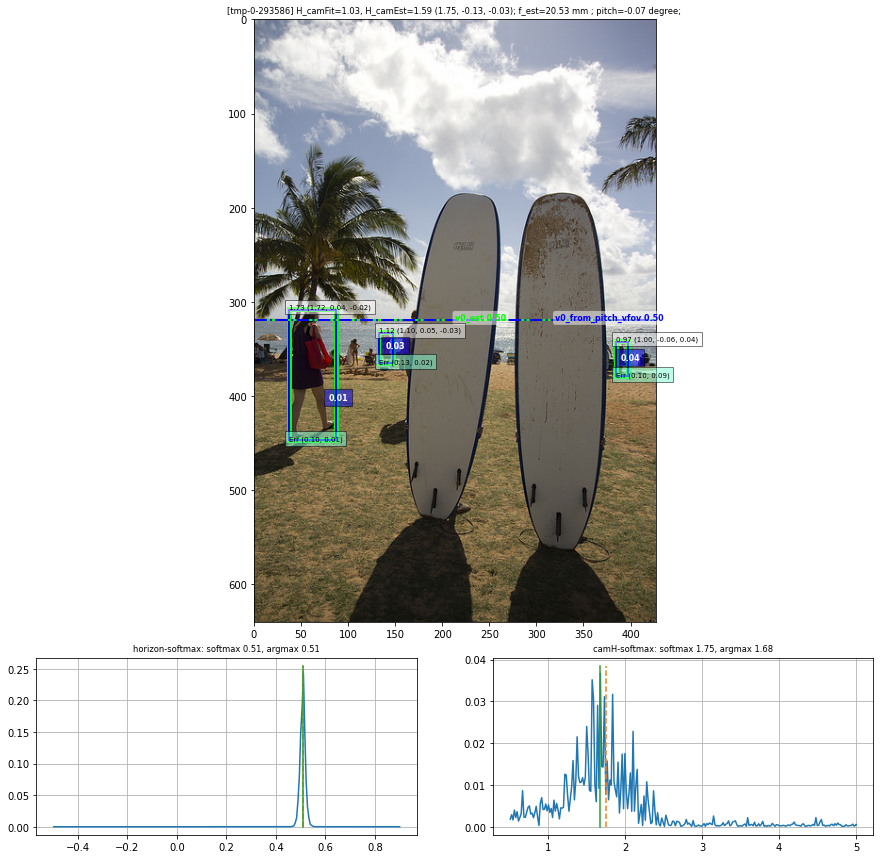

plt.show()
Vis saved to release_results/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers-predH/png/coco_testSet-000000-evalMode_reproj_reproj.jpg
/home/ruizhu/Downloads/blender-2.79b-linux-glibc219-x86_64/blender /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/scene_chair_fix.blend --background --python /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/render_coco_rui_cylinder_all_fix_final.py -- -npy_path /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/tmp_dir -img_path /data/COCO/train2017/000000293586.jpg -tmp_code H47M1jemKqkDWW72uvsNbu48pUmTTxty -H 640 -W 427 -insertion_points_x -1 -insertion_points_y -1 -pitch -0.001266 -fov_h 1.053084 -fov_v 1.433395 -cam_h 1.590576
(132.566

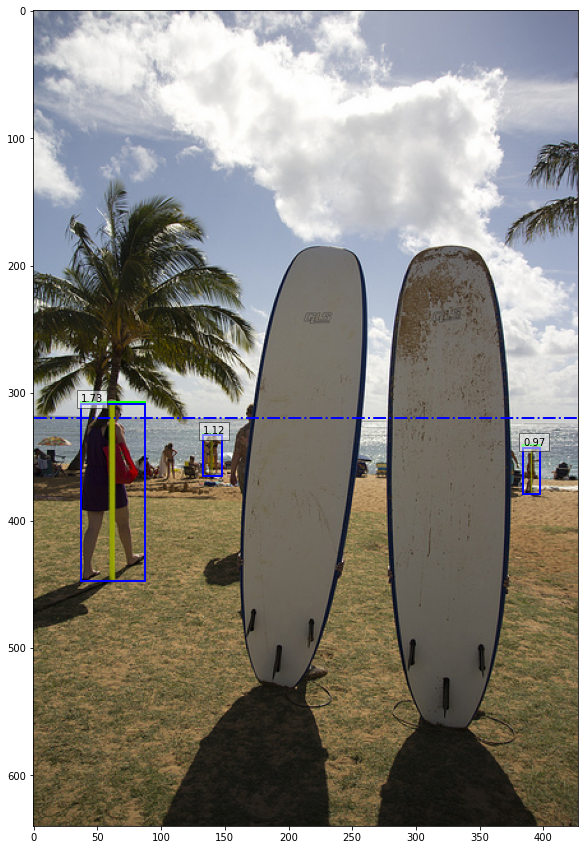

1it [00:03,  3.27s/it]/home/ruizhu/anaconda3/envs/scalenet/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


======>>>>>Helanyi: 168.35008239746094
---z tensor(17.6557, device='cuda:0')
---z1 tensor(-730.3166, device='cuda:0')
---z2 tensor(-41.3643, device='cuda:0')
======>>>>>RUI----: 168.35009765625
======>>>>>Helanyi: 204.86404418945312
---z tensor(6.9118, device='cuda:0')
---z1 tensor(-730.3166, device='cuda:0')
---z2 tensor(-105.6623, device='cuda:0')
======>>>>>RUI----: 204.86410522460938


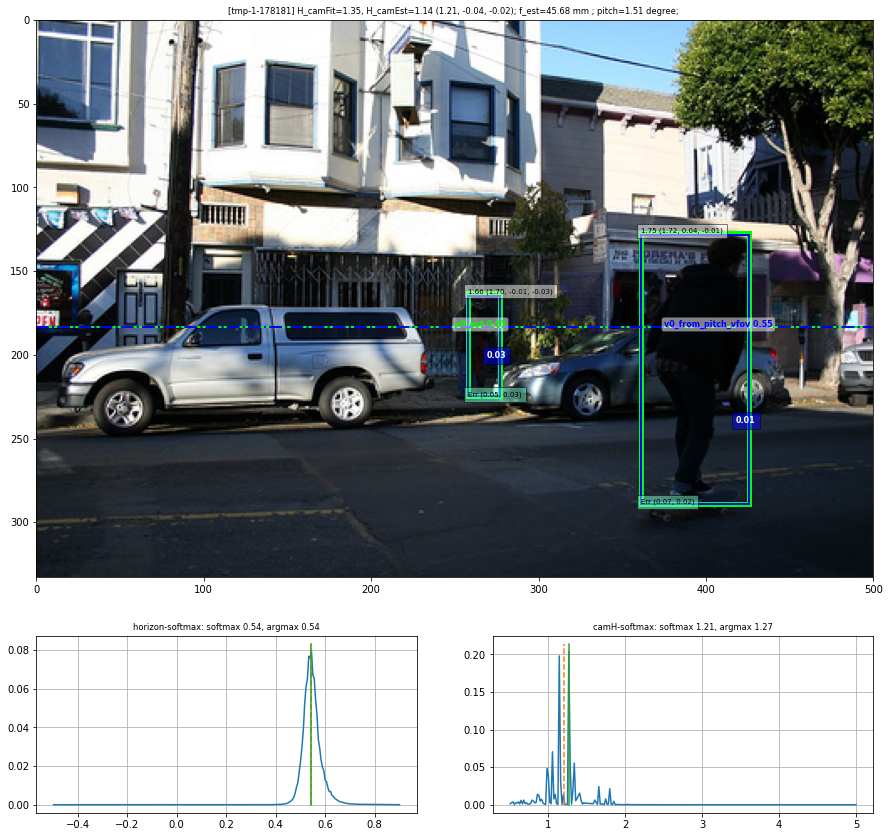

plt.show()
Vis saved to release_results/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers-predH/png/coco_testSet-000001-evalMode_reproj_reproj.jpg
/home/ruizhu/Downloads/blender-2.79b-linux-glibc219-x86_64/blender /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/scene_chair_fix.blend --background --python /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/render_coco_rui_cylinder_all_fix_final.py -- -npy_path /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/tmp_dir -img_path /data/COCO/train2017/000000178181.jpg -tmp_code tSg0j1tS92ByFsLGjgd9n0cc0oXTiNfq -H 333 -W 500 -insertion_points_x -1 -insertion_points_y -1 -pitch 0.026319 -fov_h 0.746690 -fov_v 0.510390 -cam_h 1.144307
(257.8849

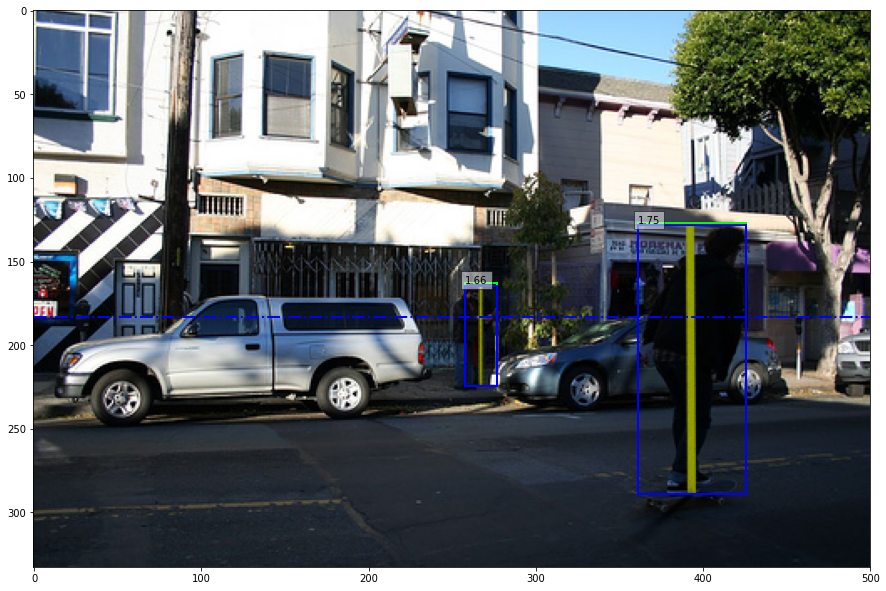

2it [00:06,  3.15s/it]/home/ruizhu/anaconda3/envs/scalenet/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


======>>>>>Helanyi: 424.3390197753906
---z tensor(4.7596, device='cuda:0')
---z1 tensor(-1249.6964, device='cuda:0')
---z2 tensor(-262.5659, device='cuda:0')
======>>>>>RUI----: 424.33905029296875
======>>>>>Helanyi: 390.17254638671875
---z tensor(4.9231, device='cuda:0')
---z1 tensor(-1249.6964, device='cuda:0')
---z2 tensor(-253.8415, device='cuda:0')
======>>>>>RUI----: 390.172607421875
======>>>>>Helanyi: 414.3182373046875
---z tensor(3.8274, device='cuda:0')
---z1 tensor(-1249.6964, device='cuda:0')
---z2 tensor(-326.5139, device='cuda:0')
======>>>>>RUI----: 414.318359375
======>>>>>Helanyi: 381.4477844238281
---z tensor(4.9756, device='cuda:0')
---z1 tensor(-1249.6964, device='cuda:0')
---z2 tensor(-251.1628, device='cuda:0')
======>>>>>RUI----: 381.44781494140625


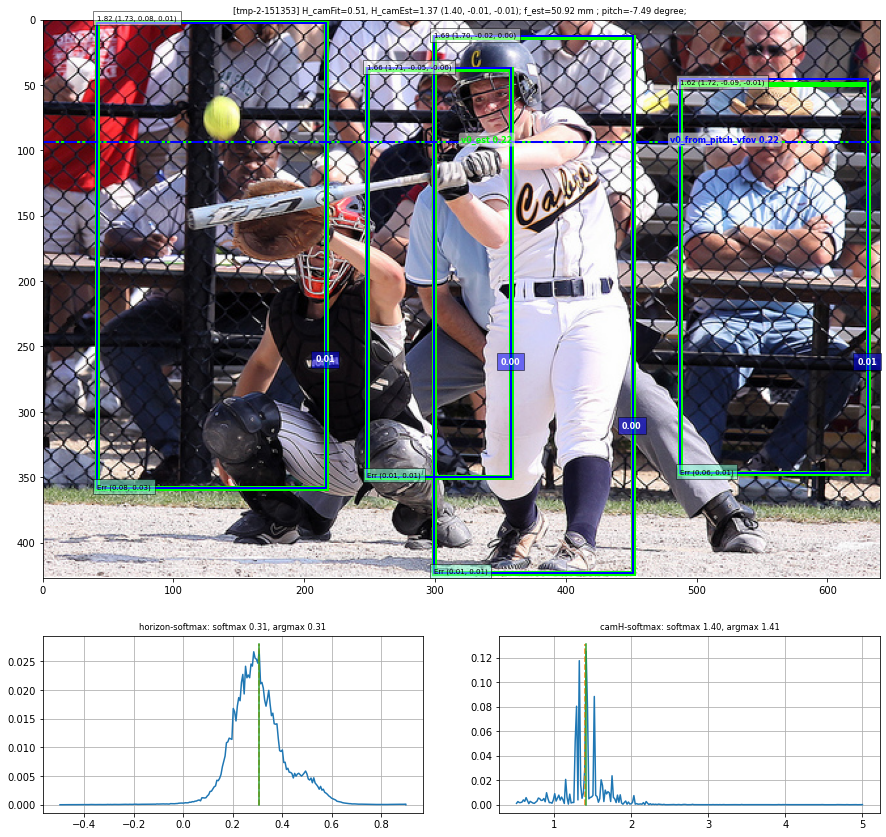

plt.show()
Vis saved to release_results/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers-predH/png/coco_testSet-000002-evalMode_reproj_reproj.jpg
/home/ruizhu/Downloads/blender-2.79b-linux-glibc219-x86_64/blender /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/scene_chair_fix.blend --background --python /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/render_coco_rui_cylinder_all_fix_final.py -- -npy_path /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/tmp_dir -img_path /data/COCO/train2017/000000151353.jpg -tmp_code Vb4ziMovqx0Cf868Tg2cKpyTAbhkUr8U -H 427 -W 640 -insertion_points_x -1 -insertion_points_y -1 -pitch -0.130765 -fov_h 0.675521 -fov_v 0.460352 -cam_h 1.371618
(41.6648

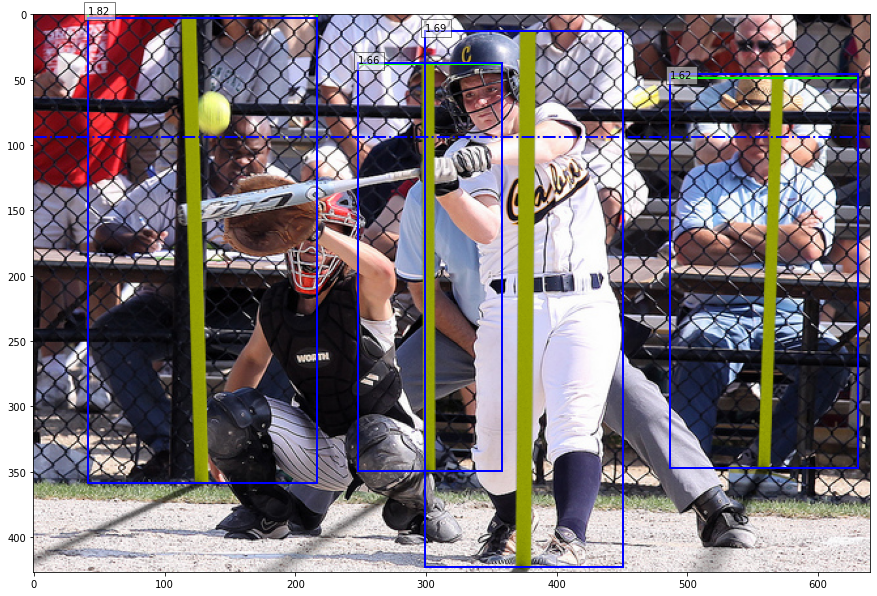

3it [00:09,  3.31s/it]/home/ruizhu/anaconda3/envs/scalenet/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


======>>>>>Helanyi: 416.0713806152344
---z tensor(8.2800, device='cuda:0')
---z1 tensor(-1084.5015, device='cuda:0')
---z2 tensor(-130.9781, device='cuda:0')
======>>>>>RUI----: 416.07135009765625
======>>>>>Helanyi: 409.6134033203125
---z tensor(8.8897, device='cuda:0')
---z1 tensor(-1084.5015, device='cuda:0')
---z2 tensor(-121.9950, device='cuda:0')
======>>>>>RUI----: 409.6133728027344
======>>>>>Helanyi: 433.6946716308594
---z tensor(7.9761, device='cuda:0')
---z1 tensor(-1084.5015, device='cuda:0')
---z2 tensor(-135.9687, device='cuda:0')
======>>>>>RUI----: 433.6946716308594


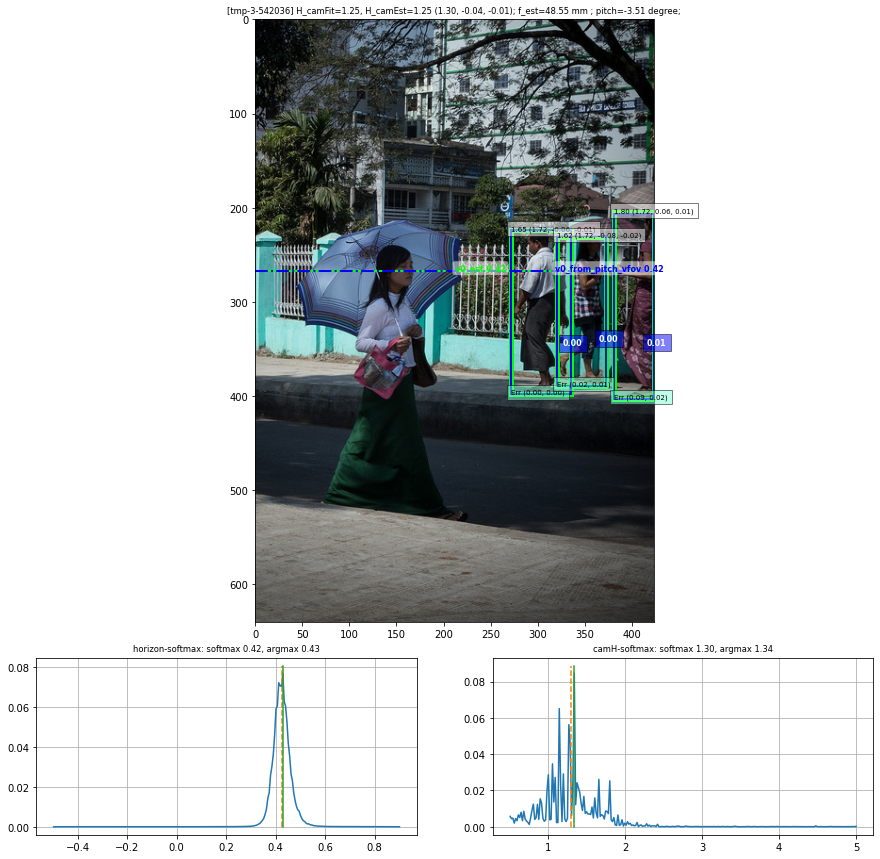

plt.show()
Vis saved to release_results/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers-predH/png/coco_testSet-000003-evalMode_reproj_reproj.jpg
/home/ruizhu/Downloads/blender-2.79b-linux-glibc219-x86_64/blender /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/scene_chair_fix.blend --background --python /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/render_coco_rui_cylinder_all_fix_final.py -- -npy_path /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/tmp_dir -img_path /data/COCO/train2017/000000542036.jpg -tmp_code wVC0muBH6MfjPrFRnF66utPQx3UXNKte -H 640 -W 424 -insertion_points_x -1 -insertion_points_y -1 -pitch -0.061324 -fov_h 0.479717 -fov_v 0.707277 -cam_h 1.251098
(271.999

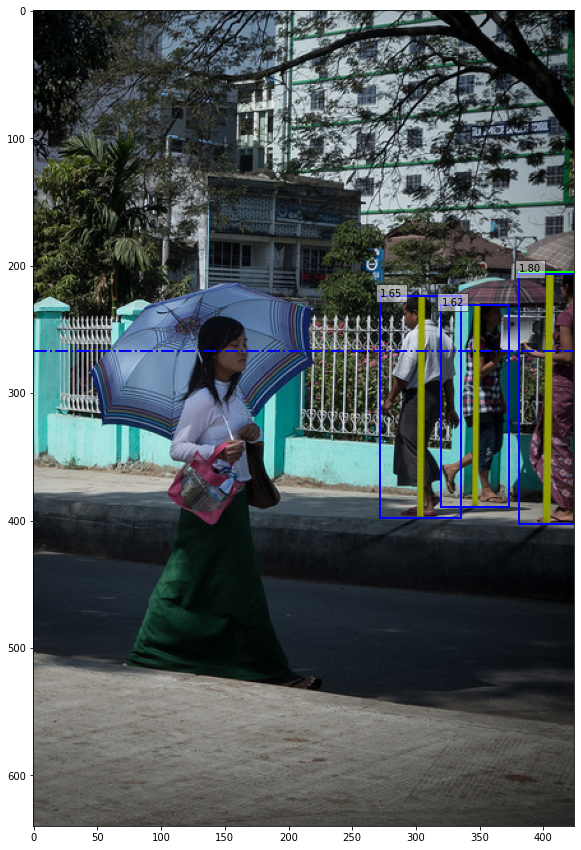

4it [00:12,  3.25s/it]/home/ruizhu/anaconda3/envs/scalenet/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


======>>>>>Helanyi: 319.7529296875
---z tensor(4.6845, device='cuda:0')
---z1 tensor(-939.2172, device='cuda:0')
---z2 tensor(-200.4956, device='cuda:0')
======>>>>>RUI----: 319.7528991699219
======>>>>>Helanyi: 297.61175537109375
---z tensor(4.8539, device='cuda:0')
---z1 tensor(-939.2172, device='cuda:0')
---z2 tensor(-193.4958, device='cuda:0')
======>>>>>RUI----: 297.61175537109375
======>>>>>Helanyi: 325.33331298828125
---z tensor(5.0633, device='cuda:0')
---z1 tensor(-939.2172, device='cuda:0')
---z2 tensor(-185.4960, device='cuda:0')
======>>>>>RUI----: 325.3332824707031


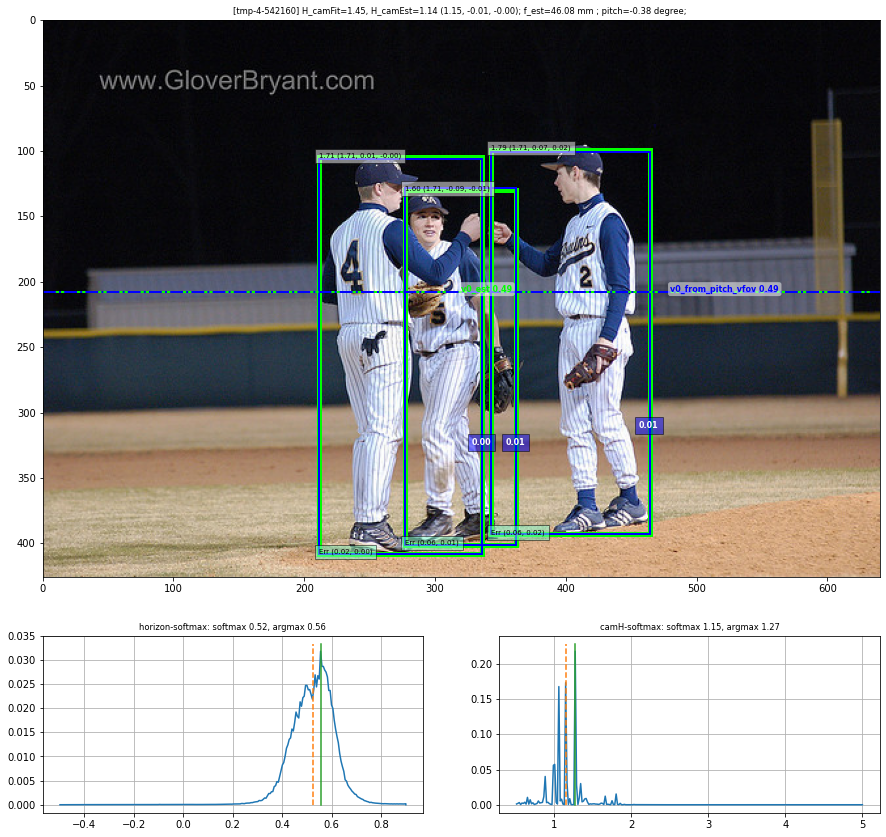

plt.show()
Vis saved to release_results/20200222-162430_pod_backCompat_adam_wPerson05_720-540_REafterDeathV_afterFaster_bs16_fix3_nokpsLoss_personLoss3Layers_loss3layers-predH/png/coco_testSet-000004-evalMode_reproj_reproj.jpg
/home/ruizhu/Downloads/blender-2.79b-linux-glibc219-x86_64/blender /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/scene_chair_fix.blend --background --python /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/render_coco_rui_cylinder_all_fix_final.py -- -npy_path /home/ruizhu/Documents/Projects/adobe_rui_camera-calibration-redux/RELEASE_ScaleNet/RELEASE_SUN360_camPred_minimal/rendering/tmp_dir -img_path /data/COCO/train2017/000000542160.jpg -tmp_code ceohcS1TwygZgFjlnF7Qutki18fTwtyq -H 426 -W 640 -insertion_points_x -1 -insertion_points_y -1 -pitch -0.006675 -fov_h 0.740919 -fov_v 0.505969 -cam_h 1.139950
(210.999

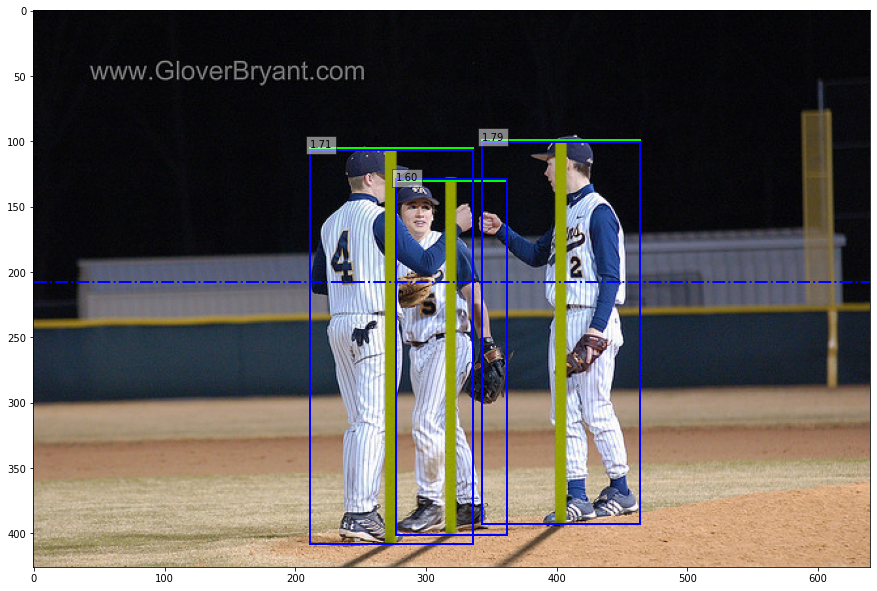

4it [00:16,  4.11s/it]


In [13]:
opt.zero_pitch = False

select_show = -1
# select_show = 0
# select_show = 35, 38, 41 # large pitch
# select_show = 35
# select_show = 923 # 30 degree pitch
# select_show = 12
# select_show = 18
# select_show = 15 # example of fitting person height

from IPython.display import clear_output

from utils.model_utils import bboxArray_to_bboxList, get_pitch_est_v0, accu_model, approx_model, human_prior, get_pitch_est_v0_mid
from utils.train_utils import print_white_blue, white_blue, print_red, red# Eval
from utils.model_utils import get_bins_combine
import utils.model_utils as model_utils

from utils.utils_misc import *
from dataset_coco_pickle_eccv import bin2midpointpitch
from utils import utils_coco
from utils.train_utils import print_f_info, f_pixels_to_mm
import utils.geo_utils as geo_utils

import matplotlib.pyplot as plt
import skimage.io as io
from matplotlib.patches import Rectangle
# sys.path.append('/home/ruizhu/Documents/Projects/adobe_scale_est/cocoapi/PythonAPI')
import utils.utils_coco as utils_coco
from utils.vis_utils import show_cam_bbox

from tqdm import tqdm

%matplotlib inline

logger = setup_logger("logger:train", summary_path, get_rank(), filename="logger_maskrcn-style.txt")

## START TRAINING
best_loss = float('inf')
bins = get_bins_combine(device)
tid = 0

epoch = 0
eval_loss = 0

model.eval()

cpu_device = torch.device("cpu")
loss_func = torch.nn.L1Loss()
if opt.distributed:
    rank = dist.get_rank()
else:
    rank = 0
    
eval_loss_vt_list = []
eval_loss_person_list = []
vt_loss_allBoxes_dict = {}
vt_loss_allBoxes_dict_list = []

im_filename_list = []

test_list = []

vt_loss_all =[]

num_plots = 0
pitch_abs_list = []
with torch.no_grad():
    for i, (_, inputCOCO_Image_maskrcnnTransform_list, W_batch_array, H_batch_array, yc_batch, \
            bboxes_batch_array, bboxes_length_batch_array, v0_batch, f_pixels_yannick_batch, im_filename, im_file, target_maskrcnnTransform_list, labels_list) in tqdm(enumerate(test_loader)):
        
        if select_show != -1 and i < select_show:
            continue
        if_vis = True
#         if i < 20:
#             if_vis = True
#         else:
#             if_vis = False
        tid = i
#         print(i, im_filename)

        input_dict = {'inputCOCO_Image_maskrcnnTransform_list': inputCOCO_Image_maskrcnnTransform_list, 'W_batch_array': W_batch_array, 'H_batch_array': H_batch_array, \
                      'yc_batch': yc_batch, \
                      'bboxes_batch_array': bboxes_batch_array, 'bboxes_length_batch_array': bboxes_length_batch_array, \
                      'v0_batch': v0_batch, 'f_pixels_yannick_batch': f_pixels_yannick_batch, 'im_filename': im_filename, 'im_file': im_file, \
                      'bins': bins, 'target_maskrcnnTransform_list': target_maskrcnnTransform_list, 'labels_list': labels_list}
#         if opt.train_cameraCls:
#             input_dict.update({\
#                       'inputSUN360_Image_maskrcnnTransform_list': inputSUN360_Image_maskrcnnTransform_list, 'im_paths_SUN360': im_paths_SUN360, \
#                       'pitch_dist_gt': pitch_dist_gt, 'roll_dist_gt': roll_dist_gt, 'vfov_dist_gt': vfov_dist_gt, 'horizon_dist_gt': horizon_dist_gt, 'metadata': metadata, \
#                       'pitch_num': pitch_list, 'roll_num': roll_list, 'vfov_num': vfov_list, 'horizon_num': horizon_list, 'f_num': focal_length_35mm_eq_list, 'sensor_size_num': sensor_size_list, \
#                         'W_list': W_list, 'H_list': H_list})

        if_print = is_training
        cfg = opt.cfg
        bins = input_dict['bins']

        # ========= Rui's inputs
        inputCOCO_Image_maskrcnnTransform_list = input_dict['inputCOCO_Image_maskrcnnTransform_list']
        bboxes_batch, v0_batch_offline, f_pixels_yannick_batch_offline, W_batch, H_batch, yc_batch_offline = \
            torch.from_numpy(input_dict['bboxes_batch_array']).float().to(device), input_dict['v0_batch'].to(device), input_dict['f_pixels_yannick_batch'].to(device), \
            torch.from_numpy(input_dict['W_batch_array']).to(device), torch.from_numpy(input_dict['H_batch_array']).to(device), input_dict['yc_batch'].to(device)

        if not opt.not_rcnn:
            list_of_bbox_list_cpu = model_utils.bboxArray_to_bboxList(bboxes_batch, input_dict['bboxes_length_batch_array'], input_dict['W_batch_array'], input_dict['H_batch_array'])
        else:
            list_of_bbox_list_cpu = []

        list_of_oneLargeBbox_list_cpu = model_utils.oneLargeBboxList(input_dict['W_batch_array'], input_dict['H_batch_array']) # in original image size
        list_of_oneLargeBbox_list = [bbox_list_array.to(device) for bbox_list_array in list_of_oneLargeBbox_list_cpu]


        if if_vis:
            input_dict_show = {'H': input_dict['H_batch_array'], 'W': input_dict['W_batch_array']}
            if 'testSet' not in prepostfix:
                input_dict_show.update({'v0_cocoPredict': input_dict['v0_batch'].numpy()})
            input_dict_show['bbox_gt'] = []
            input_dict_show['bbox_est'] = []
            input_dict_show['bbox_fit'] = []
            input_dict_show['bbox_h'] = []
            input_dict_show['bbox_geo'] = []
            input_dict_show['bbox_loss'] = []

        input_dict_misc = {'bins': bins, 'is_training': is_training, 'H_batch': H_batch, 'W_batch': W_batch, 'bboxes_batch': bboxes_batch, 'loss_func': loss_func, \
                           'cpu_device': cpu_device,  'device': device, 'tid': tid, 'rank': rank, 'data': 'coco', 'if_vis': if_vis}
        output_RCNN = model(input_dict_misc=input_dict_misc, input_dict=input_dict, image_batch_list=inputCOCO_Image_maskrcnnTransform_list, \
                            list_of_bbox_list_cpu=list_of_bbox_list_cpu, list_of_oneLargeBbox_list=list_of_oneLargeBbox_list, \
                            )
        pitch_abs_degree = abs(output_RCNN['pitch_batch_est'][0].item()) / np.pi * 180.
        pitch_abs_list.append(pitch_abs_degree)
#         if pitch_abs_degree < 15:
#             continue
        if 'zero_pitch' in opt and opt.zero_pitch:
            output_RCNN['pitch_batch_est'] *= 0.
            output_RCNN['output_pitch'] *= 0.
            output_RCNN['v0_batch_from_pitch_vfov'] = output_RCNN['v0_batch_from_pitch_vfov'] * 0. + H_batch[0] / 2.
            output_RCNN['v0_batch_est'] = output_RCNN['v0_batch_from_pitch_vfov']
            
        output_horizon = output_RCNN['output_horizon']
        output_pitch = output_RCNN['output_pitch']
        output_vfov = output_RCNN['output_vfov']
        output_yc_batch = output_RCNN['output_yc_batch']
        f_pixels_yannick_batch_ori = f_pixels_yannick_batch_offline.clone()
        v0_batch_ori = v0_batch_offline.clone()
        
        v0_batch_est = output_RCNN['v0_batch_est']
        v0_batch_from_pitch_vfov = output_RCNN['v0_batch_from_pitch_vfov']


        vfov_estim = output_RCNN['vfov_estim']
        f_pixels_yannick_batch_est = output_RCNN['f_pixels_batch_est']

        pitch_batch_est = output_RCNN['pitch_batch_est']
        pitch_estim_yannick = output_RCNN['pitch_estim_yannick']

        yc_est_batch = output_RCNN['yc_est_batch']

        person_h_list = output_RCNN['person_h_list']
        all_person_hs = output_RCNN['all_person_hs']

        reduce_method = output_RCNN['reduce_method']
        


        if tid % opt.summary_every_iter == 0 and if_print:
            f_mm_array_est = f_pixels_to_mm(f_pixels_yannick_batch_est, input_dict)

        ## Losses for bbox fitting
        vt_loss_sample_batch_list = []
        vt_loss_allBoxes_dict_cpu = {}
        vt_error_fit_allBoxes_dict_cpu = {}
        camH_fit_batch = []

        for idx, bboxes_length in enumerate(input_dict['bboxes_length_batch_array']):
            bboxes = bboxes_batch[idx][:bboxes_length] # [N, 4]
            # W = W_batch[idx]
            H = H_batch[idx]
            vc = H / 2.
            v0_est = v0_batch_est[idx]
            v0_ori = v0_batch_ori[idx]  # [top H, bottom 0]
            pitch_est = pitch_batch_est[idx]
            f_pixels_yannick_est = f_pixels_yannick_batch_est[idx]
            inv_f2 = 1. / (f_pixels_yannick_est * f_pixels_yannick_est)
            yc_est = yc_est_batch[idx]

            H_np = H_batch[idx].cpu().numpy()
            W_np = W_batch[idx].cpu().numpy()

            if opt.not_rcnn:
                h_human_s = torch.from_numpy(np.asarray([1.75] * bboxes.shape[0], dtype=np.float32)).float().to(device)
                # h_human_s = [1.75] * bboxes.shape[0]
            else:
                h_human_s = person_h_list[idx] * output_RCNN['straighten_ratios_list'][idx]

            vt_loss_sample_list = []
            vt_error_sample_fit_list = []

            # Fitting 现场: getting camera heights
            camH_fit_list = []
            for bbox_idx, bbox in enumerate(bboxes):
                y_person_fit = 1.75
                camH_fit_bbox = geo_utils.fit_camH(bbox.cpu(), H.cpu(), v0_est.cpu(), vc.cpu(), f_pixels_yannick_est.cpu(), y_person_fit)
                camH_fit_list.append(camH_fit_bbox.detach().numpy())
            camH_fit = np.median(np.array(camH_fit_list))
            camH_fit_batch.append(camH_fit)

            bbox_gt_sample = []
            bbox_est_sample = []
            bbox_fit_sample = []
            bbox_h_sample = []
            bbox_geo_sample = []
            bbox_loss_sample = []
            for bbox_idx, (bbox, y_person) in enumerate(zip(bboxes, h_human_s)):
                vb = H - (bbox[1] + bbox[3]) # [top H bottom 0]
                vt_gt = H - bbox[1] # [top H bottom 0]
                
                ## Fit y_person
                geo_model_input_dict = {'yc_est': yc_est, 'vb': vb, 'y_person': y_person, 'v0': v0_est, 'vc': vc, 'f_pixels_yannick': f_pixels_yannick_est, 'pitch_est': pitch_est}
                negative_z = False
                if opt.accu_model:
                    vt_camEst, z, negative_z = model_utils.accu_model_helanyi(geo_model_input_dict, if_debug=False)  # [top H bottom 0]
                    print('======>>>>>Helanyi:', vt_camEst.item())
                    geo_model_input_dict_rui = {'yc_est': yc_est, 'vb': vb, 'y_person': y_person*torch.cos(pitch_est), 'v0': v0_est, 'vc': vc, 'f_pixels_yannick': f_pixels_yannick_est, 'pitch_est': pitch_est}
                    vt_camEst_rui, z_rui, negative_z_rui = model_utils.accu_model(geo_model_input_dict_rui, if_debug=False)  # [top H bottom 0]
                    print('======>>>>>RUI----:', vt_camEst_rui.item())
#                     geo_model_input_dict_rui = {'yc_est': yc_est, 'vb': vb, 'y_person': y_person, 'v0': v0_est, 'vc': vc, 'f_pixels_yannick': f_pixels_yannick_est, 'pitch_est': pitch_est}
#                     vt_camEst_rui, z_rui, negative_z_rui = model_utils.accu_model_fixedz(geo_model_input_dict_rui, if_debug=False)  # [top H bottom 0]
#                     print('======>>>>>RUI FIXEDZ----:', vt_camEst_rui.item())
                else:
                    vt_camEst = model_utils.approx_model(geo_model_input_dict)

                vt_loss = loss_func(vt_gt, vt_camEst.reshape([])) / bbox[3]
                vt_loss = torch.clamp(vt_loss, 0., opt.cfg.MODEL.LOSS.VT_LOSS_CLAMP)
                if negative_z and if_debug:
                    print('>>>>>>', negative_z, vt_loss)
                # vt_loss = vt_loss * (not(negative_z))
                vt_loss = torch.where(torch.isnan(vt_loss), torch.zeros_like(vt_loss), vt_loss)
                if negative_z and if_debug:
                    print('>>>>>>>>>>>', vt_loss)
                vt_loss_sample_list.append(vt_loss)
                vt_loss_allBoxes_dict_cpu.update({'bbox_vt_loss_tid%04d_rank%d_%02d-%02d'%(tid, rank, idx, bbox_idx): vt_loss.to(cpu_device)})

                # Fitting 现场: getting vt
                y_person_fit = 1.75
                vt_camFit = geo_utils.fit_vt(camH_fit, vb, v0_est, vc, y_person_fit, 1. / (f_pixels_yannick_est  * f_pixels_yannick_est))
                vt_error_fit = loss_func(vt_gt, vt_camFit) / bbox[3]

                vt_error_fit_allBoxes_dict_cpu.update({'bbox_vt_error_fit_tid%04d_rank%d_%02d-%02d'%(tid, rank, idx, bbox_idx): vt_error_fit.to(cpu_device)})

                vt_error_sample_fit_list.append(vt_error_fit.detach().cpu().numpy().item())

                if if_vis:
                    bbox_np = bbox.cpu().numpy()
                    vt_camEst_np = vt_camEst.detach().cpu().numpy()
                    vt_camFit_np = vt_camFit.detach().cpu().numpy()
                    bbox_gt_sample.append([bbox_np[0], bbox_np[1], bbox_np[2], bbox_np[3]]) # [x, y (top), w, h]
                    bbox_est_sample.append([bbox_np[0], H_np - vt_camEst_np, bbox_np[2], bbox_np[1]+bbox_np[3]-(H_np - vt_camEst_np)])
                    bbox_h_sample.append(y_person.cpu().detach().numpy())
                    bbox_geo_sample.append(geo_model_input_dict)
                    bbox_loss_sample.append(vt_loss.item())

            if if_vis:
                input_dict_show['bbox_gt'].append(bbox_gt_sample)
                input_dict_show['bbox_est'].append(bbox_est_sample)
                input_dict_show['bbox_fit'].append(bbox_fit_sample)
                input_dict_show['bbox_h'].append(bbox_h_sample)
                input_dict_show['bbox_geo'].append(bbox_geo_sample)
                input_dict_show['bbox_loss'].append(bbox_loss_sample)


            vt_loss_sample = torch.mean(torch.stack(vt_loss_sample_list))
            vt_loss_sample_batch_list.append(vt_loss_sample)

        vt_loss_batch = torch.stack(vt_loss_sample_batch_list)
        loss_vt = torch.mean(vt_loss_batch)

        return_dict = {'vt_loss_batch': vt_loss_batch, 'vt_loss_allBoxes_dict': vt_loss_allBoxes_dict_cpu, 'vt_error_fit_allBoxes_dict': vt_error_fit_allBoxes_dict_cpu, \
                       'yc_est_batch': yc_est_batch, 'yc_batch_offline': yc_batch_offline, 'yc_fit_batch': np.array(camH_fit_batch)}
        vt_loss_allBoxes_dict_list.append(vt_loss_allBoxes_dict_cpu)
        if tid % opt.summary_every_iter == 0 and if_print:
            return_dict.update({'f_mm_batch': f_mm_array_est.reshape(-1, 1)})

        if 'loss_vt_list' in output_RCNN:
            loss_vt_list = output_RCNN['loss_vt_list']
            assert len(loss_vt_list) != 0
        else:
            loss_vt_list = []
        loss_vt_list.append(loss_vt)
        return_dict.update({'loss_vt_list': loss_vt_list})
        loss_dict = {'loss_vt': sum(loss_vt_list)/len(loss_vt_list)} # mean of layers; for optimization and scheduler

        if opt.pointnet_camH_refine:
            loss_vt_layers_dict = {}
            for loss_idx, loss in enumerate(loss_vt_list):
                loss_vt_layers_dict['loss_vt_layer_%d'%(loss_idx-len(loss_vt_list))] = loss

            return_dict.update({'loss_vt_layers_dict': loss_vt_layers_dict})


        if not opt.not_rcnn:
            return_dict.update({'all_person_hs': all_person_hs})
            loss_all_person_h_list = output_RCNN['loss_all_person_h_list']
            return_dict.update({'loss_all_person_h_list': loss_all_person_h_list})
            loss_dict.update({'loss_person': sum(loss_all_person_h_list)/len(loss_all_person_h_list)}) # mean of layers; for optimization and scheduler


        # ========== Some vis
        if if_vis:
            input_dict_show['W_batch_array'] = input_dict['W_batch_array']
            input_dict_show['H_batch_array'] = input_dict['H_batch_array']
            if opt.est_kps:    
                input_dict_show['predictions'] = output_RCNN['predictions']
                input_dict_show['target_maskrcnnTransform_list'] = input_dict['target_maskrcnnTransform_list']
#             input_dict_show['v0_batch_predict'] = v0_batch_predict.detach().cpu().numpy()  # (H = top of the image, 0 = bottom of the image)
            input_dict_show['v0_batch_from_pitch_vfov'] = v0_batch_from_pitch_vfov.detach().cpu().numpy()
            input_dict_show['v0_batch_est'] = v0_batch_est.detach().cpu().numpy()
            if 'v0_batch_est_0' in output_RCNN:
                input_dict_show['v0_batch_est_0'] = output_RCNN['v0_batch_est_0'].detach().cpu().numpy()
            f_pixels_yannick_single_est = f_pixels_yannick_batch_est.detach().cpu().numpy()
            f_pixels_yannick_single_est_mm = [utils_coco.fpix_to_fmm(f_pixels_yannick_single_est_0, H_np, W_np) for f_pixels_yannick_single_est_0 in f_pixels_yannick_single_est]
            f_pixels_yannick_single_ori = f_pixels_yannick_batch_ori.detach().cpu().numpy()
            f_pixels_yannick_single_ori_mm = [utils_coco.fpix_to_fmm(f_pixels_yannick_single_ori_0, H_np, W_np) for f_pixels_yannick_single_ori_0 in f_pixels_yannick_single_ori]
            input_dict_show.update({'yc_fit': yc_batch_offline.detach().cpu().numpy(), 'yc_est': yc_est_batch.detach().cpu().numpy()})

            if len(output_RCNN['yc_est_batch_np_list']) > 1: # more than one layers
                input_dict_show.update({'yc_est_list': output_RCNN['yc_est_batch_np_list']})
            if len(output_RCNN['person_hs_est_np_list']) > 1:
                input_dict_show.update({'person_hs_est_list': output_RCNN['person_hs_est_np_list']})
            if 'vt_camEst_N_delta_np_list' in output_RCNN and len(output_RCNN['vt_camEst_N_delta_np_list']) > 1:
                input_dict_show.update({'vt_camEst_N_delta_est_list': output_RCNN['vt_camEst_N_delta_np_list']})
            if len(output_RCNN['f_pixels_est_batch_np_list']) > 1: # more than one layers
                input_dict_show.update({'f_pixels_est_mm_list': [utils_coco.fpix_to_fmm(f_pixels_est_0, H_np, W_np) for f_pixels_est_0 in output_RCNN['f_pixels_est_batch_np_list']]})
            if len(output_RCNN['v0_01_est_batch_np_list']) > 1: # more than one layers
                input_dict_show.update({'v0_est_list': output_RCNN['v0_01_est_batch_np_list']})

            input_dict_show.update({'f_est_px': f_pixels_yannick_single_est, 'f_est_mm': f_pixels_yannick_single_est_mm})
            input_dict_show.update({'f_cocoPredict': f_pixels_yannick_single_ori, 'f_cocoPredict_mm': f_pixels_yannick_single_ori_mm})
            input_dict_show.update({'pitch_est_angle': pitch_batch_est.detach().cpu().numpy()/np.pi*180.})

            input_dict_show['im_path'] = list(input_dict['im_file'])
            input_dict_show['im_filename'] = list(input_dict['im_filename'])
            num_samples = len(input_dict['im_file'])
            input_dict_show['output_horizon_COCO'] = output_RCNN['output_horizon'].detach().cpu().numpy()
            input_dict_show['horizon_bins'] = [bins['horizon_bins_centers_torch'].cpu().numpy()] * num_samples

            if not opt.direct_camH:
                input_dict_show['output_camH_COCO'] = output_RCNN['output_yc_batch'].detach().cpu().numpy()
                input_dict_show['camH_bins'] = [bins['yc_bins_centers_torch'].cpu().numpy()] * num_samples

            input_dict_show['tid'] = [tid] * num_samples
            input_dict_show['task_name'] = [opt.task_name] * num_samples
            input_dict_show['num_samples'] = num_samples
            input_dict_show['reduce_method'] = [reduce_method] * num_samples
            input_dict_show.update({'vfov_est': vfov_estim.detach().cpu().numpy(), 'pitch_est_yannick': pitch_estim_yannick.detach().cpu().numpy()})

            if input_dict_show['num_samples'] > 0:
                input_dict_show_list = batch_dict_to_list_of_dicts(input_dict_show)
                input_dict_show = input_dict_show_list[0]

        prefix, postfix = prepostfix.split('|')
        
        save_path_blender = results_path_png
        save_path_ours = results_path_png
        prefix = 'coco_' + prefix
        postfix += '_reproj'
        
        if if_vis:
            vis_utils.show_cam_bbox(io.imread(input_dict_show['im_path']), input_dict_show, figzoom=1.5, if_show=True, \
                                    if_save=True if save_path_ours else False, if_pause=False, save_path=save_path_ours, save_name=prefix+'%06d'%(tid)+postfix+'_reproj')
            if opt.est_kps:
                vis_utils.show_box_kps(opt, model, io.imread(input_dict_show['im_path']), input_dict_show, if_show=True, if_pause=False, save_path='', save_name=prefix+'tid%d'%(tid)+postfix)
            
            if if_blender:
                tmp_code = ''.join([random.choice(string.ascii_letters + string.digits) for n in range(32)])
                blender_render(input_dict_show, im_file, save_path=save_path_ours, if_show=True, idx=tid, save_name=prefix+'%06d'%(tid)+postfix+'_render', tmp_code=tmp_code, \
                              render_type='cylinder', pick=-1, grid=False)
        num_plots += 1
        if num_plots >=5:
            break

#         break

# Set up Blender for rendering virtual objects

In [9]:
# [!!!!!!] Change to your path of Blender binary!
blender_path = '/home/ruizhu/Downloads/blender-2.79b-linux-glibc219-x86_64/blender'

if_blender = True

def blender_render(input_dict_show, im_file, save_path='./', if_show=False, idx=0, save_name='', tmp_code='iamgroot', \
                   render_type='cylinder', if_compact=False, pick=-1, grid=False):
    assert render_type in ['chair', 'cylinder']
    scene_path = current_dir + '/rendering/scene_chair_fix.blend'
    if render_type == 'chair':
        script_path = current_dir + '/rendering/render_coco_rui_chair_all_fix_final.py'
    else:
        script_path = current_dir + '/rendering/render_coco_rui_cylinder_all_fix_final.py'
    
    W = W_batch_array[0]
    H = H_batch_array[0]
    
    insertion_points_xy_list = []
    bboxes_filter = input_dict_show['bbox_gt']
    # bboxes_filter = [bboxes_filter[0]]
    bbox_hs_list = [a.item() for a in input_dict_show['bbox_h']]
    for bbox in bboxes_filter:
        insertion_points_xy_list.append([bbox[0]+bbox[2]/2., bbox[1]+bbox[3]])
#         insertion_points_xy_list.append([bbox[0], bbox[1]+bbox[3]])
    
    if pick != -1:
        insertion_points_xy_list = [insertion_points_xy_list[pick]]
        bbox_hs_list = [bbox_hs_list[pick]]
    
    u_start_end = [W/4., W/4.*3.]
    u_grid_size = (u_start_end[1] - u_start_end[0]) / 2.
    v_start_end = [H - input_dict_show['v0_batch_from_pitch_vfov']+10, H]
    # v_start_end = [0., H]
    v_grid_size = (v_start_end[1] - v_start_end[0]) / 4.
    
    if grid:
        for u in range(3):
            for v in range(5):
        #         if v > 0:
        #             continue
                insertion_points_xy_list.append([u_start_end[0] + u_grid_size * u, v_start_end[0] + v_grid_size * v])
                bbox_hs_list += [2.5 / (v+1)]
            
    # insertion_points_xy_list = insertion_points_xy_list[:1]
    tmp_dir = Path('rendering/tmp_dir')
    tmp_dir.mkdir(exist_ok=True)
    npy_path = tmp_dir / ('tmp_insert_pts_'+tmp_code)
    np.save(str(npy_path), insertion_points_xy_list)
    npy_path = tmp_dir / ('tmp_bbox_hs_'+tmp_code)
    np.save(str(npy_path), bbox_hs_list)

    im_filepath = im_file[0]
    insertion_points_x = -1
    insertion_points_y = -1
    ppitch = output_RCNN['pitch_batch_est'].cpu().numpy()[0]
    ffpixels = output_RCNN['f_pixels_batch_est'].cpu().numpy()[0]
    vvfov = output_RCNN['vfov_estim'].cpu().numpy()[0]
    hhfov = np.arctan(W / 2. / ffpixels) * 2.
    h_cam = output_RCNN['yc_est_batch'].cpu().numpy()[0]

    npy_path = Path(current_dir) / tmp_dir
    rendering_command = '%s %s --background --python %s'%(blender_path, scene_path, script_path)
    rendering_command_append = ' -- -npy_path %s -img_path %s -tmp_code %s -H %d -W %d -insertion_points_x %d -insertion_points_y %d -pitch %.6f -fov_h %.6f -fov_v %.6f -cam_h %.6f'%\
        (str(npy_path), im_filepath, tmp_code, H, W, insertion_points_x, insertion_points_y, ppitch, hhfov, vvfov, h_cam)
    rendering_command = rendering_command + rendering_command_append
    print(rendering_command)

    os.system(rendering_command)
    
    if if_show == False:
        plt.ioff()
    fig = plt.figure(figsize=(15, 15), frameon=False)
    def full_frame(width=None, height=None):
        import matplotlib as mpl
        mpl.rcParams['savefig.pad_inches'] = 0
        figsize = None if width is None else (width, height)
        fig = plt.figure(figsize=figsize)
        ax = plt.axes([0,0,1,1], frameon=False)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        plt.autoscale(tight=True)
    if if_compact:
        full_frame(15, 15)
    render_file = current_dir + '/rendering/render/render_all_%s.png'%tmp_code
    im_render = plt.imread(render_file)
    plt.imshow(im_render)

    ax = plt.gca()
    input_dict = input_dict_show
    if 'bbox_gt' in input_dict:
        for bbox in input_dict['bbox_gt']:
            rect = Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='lime', facecolor='none')
            print((bbox[0], bbox[1]+bbox[3]))
            ax.add_patch(rect)


    if 'bbox_est' in input_dict:
        for bbox in input_dict['bbox_est']:
            rect = Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='b', facecolor='none')
            ax.add_patch(rect)

    v0_batch_from_pitch_vfov = input_dict_show['v0_batch_from_pitch_vfov']
    plt.plot([0., W], [H - v0_batch_from_pitch_vfov, H - v0_batch_from_pitch_vfov], linestyle='-.', linewidth=2, color='blue')

    for y_person, bbox in zip(input_dict['bbox_h'], input_dict['bbox_gt']):
        plt.text(bbox[0], bbox[1], '%.2f'%(y_person), fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

    
    if if_compact:
        ax.set_axis_off()
        plt.axis('off')
    plt.xlim([0, W])
    plt.ylim([H, 0])
    plt.autoscale(tight=True) 
    
    plt.savefig(save_path + '/%s.jpg'%(save_name), dpi = 100, bbox_inches='tight')
    
    if if_show:
        plt.show()
        
    plt.close(fig)